# Figure S1; 6 panel plot

#### Tankersley et al. 2022, Basement topography and sediment thickness beneath Antarctica's Ross Ice Shelf; GRL

In [48]:
import pygmt
import os
import geopandas as gpd

In [49]:
cd

C:\Users\matthewt


In [50]:
cd Documents\Python_Scripts\GRL_2021_Figures

C:\Users\matthewt\Documents\Python_Scripts\GRL_2021_Figures


gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
psconvert [ERROR]: Registry registered C:\Program Files (x86)\GPLGS\gswin32c.exe does not exist. Resorting to the one provided in GMT.


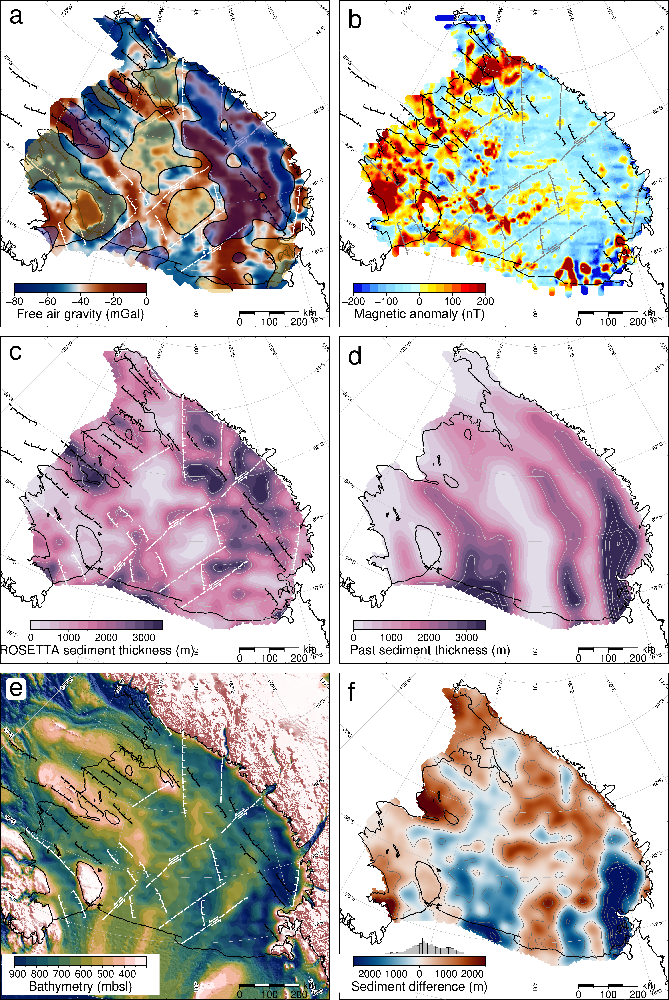

In [53]:
figheight=180 # in mm
# for RIS extent
ris_xl=-660_000
ris_xh=450_000
ris_yl=-1_500_000
ris_yh=-400_000

# Calculate the figure width and map scale
figwidth=figheight*(ris_xh-ris_xl)/(ris_yh-ris_yl)
risratio = (ris_yh - ris_yl) / (figheight/1000)
# Make a GMT region string and projection strings in both PS71 and Lon/Lat
risreg = str(ris_xl) + '/' + str(ris_xh) + '/' + str(ris_yl) + '/' + str(ris_yh) #W/E/S/N
risproj = "x1:" + str(risratio)
risproj_ll = "s0/-90/-71/1:" + str(risratio)

barwidth = figwidth/10 * 0.4 # color bar width is 40% of the map width, in cm
pos_str = 'jBL+w' + str(barwidth) + 'c/.5c+jTL+o.8c/-2.4c+h' 

fig = pygmt.Figure()

############################
############################
# 5th FIGURE Bathy
############################
############################
grid='tmp/bedmachine_bed_wgs.nc'
pygmt.grd2cpt(grid =grid, cmap = 'batlowW', limit = '-900/-300', nlevels=13, output = 'cpts/RE_bathymetry.cpt')        
cmap= 'cpts/RE_bathymetry.cpt'
frame=['xa100f50+l"Bathymetry (mbsl)"']

with pygmt.config(MAP_FRAME_TYPE = 'inside'):
    fig.grdimage(region = risreg, projection = risproj, frame=["nwse", "xf100000", "yf100000", "g0"], 
                 grid=grid, cmap=cmap, shading="grdgradient+a45+ne.5", nan_transparent=True, dpi=500)
# Plot graticules overtop, at 2d latitude and 15d longitude
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, 
                  FONT_ANNOT_PRIMARY = '8p,black,-=2p,white', 
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black',  
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')   
# Plot the grounding/coast lines
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_groundingline.shp'), region = risreg, projection = risproj, pen = '1.2p,black', verbose='e')
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_coastline.shp'), pen='1.2p,black', verbose='e')

# fig.grdcontour(grid=grid, interval=500, pen='thinner,gray')

active_color='black'
inactive_color='white'
pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
hatch_style='f+.4c/.3c+l+i'
# Plot christines inactive faults, with hatches
fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
# Left lateral, with arrows
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
# no kinematics
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
# Plot christines active faults, with hatches
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible


with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '20p,black'):
        fig.colorbar(cmap=cmap, position = pos_str,  box = '+gwhite+c3p', frame=frame, verbose='e')
# SCALEBAR
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '16p,black', MAP_SCALE_HEIGHT='8p', MAP_TICK_PEN_PRIMARY = '0.5p,black'):
    fig.basemap(region = risreg, projection = risproj_ll, map_scale='jBR+w200k+c170E/71S+f+l"km"+ar+o1.7c/0.6c', verbose='e') 

fig.text(projection = risproj, 
        region = risreg,
        position='TL',
        text = "e",
        fill = 'white',
        font = '40p,Helvetica,black',
        offset = 'j.5/.5',
        clearance = '+tO')

############################
############################
fig.shift_origin(xshift=(figwidth/10)+.5, yshift=0)
# 6th FIGURE Sed Thick Diff
############################
############################
pygmt.makecpt(cmap = 'vik', background='o', series='-2500/2500', output = 'cpts/sed_thickness_diff.cpt')
grid='RIS_sedthickness_diff.nc'
cmap='cpts/sed_thickness_diff.cpt'
frame=['xa1000f500+l"Sediment difference (m)"']

with pygmt.config(MAP_FRAME_TYPE = 'inside'):
    fig.grdimage(region = risreg, projection = risproj, frame=["nwse", "xf100000", "yf100000", "g0"], 
                 grid=grid, cmap=cmap, nan_transparent=True, dpi=500)
# Plot graticules overtop, at 2d latitude and 15d longitude
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, 
                  FONT_ANNOT_PRIMARY = '8p,black,-=2p,white', 
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black',  
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')   
# Plot the grounding/coast lines
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_groundingline.shp'), region = risreg, projection = risproj, pen = '1.2p,black', verbose='e')
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_coastline.shp'), pen='1.2p,black', verbose='e')

fig.grdcontour(grid='RIS_sedthickness_diff.nc', interval=1000, pen='thinner,dimgray')#, cut = "300000c")

hist_reg = '-2500/2500/0/7',   # this needs to match CMAP limits, 0/14 of 0-14% for histogram
sed_diff=pygmt.grd2xyz(grid='RIS_sedthickness_diff.nc')
fig.shift_origin(xshift='.8c', yshift="2.4c",)
fig.histogram( data=sed_diff.z,
                region=hist_reg,
                fill='grey',
                projection="X"+str(barwidth)+"c/1c",
                frame=False,
                series=100,#width of bin in data units
                pen=".1p",
                histtype=1) 
fig.plot(x=[sed_diff.z.mean(),sed_diff.z.mean()], y=[0,7], pen='2p,black')
fig.shift_origin(xshift='-.8c', yshift="-2.4c",)
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=cmap, position = pos_str, box = '+gwhite+c3p', frame=frame, verbose='e')
# SCALEBAR
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '16p,black', MAP_SCALE_HEIGHT='8p', MAP_TICK_PEN_PRIMARY = '0.5p,black'):
    fig.basemap(region = risreg, projection = risproj_ll, map_scale='jBR+w200k+c170E/71S+f+l"km"+ar+o1.7c/0.6c', verbose='e')
fig.text(projection = risproj, 
        region = risreg,
        position='TL',
        text = "f",
        fill = 'white',
        font = '40p,Helvetica,black',
        offset = 'j.5/.5',
        clearance = '+tO')


############################
###########################
fig.shift_origin(xshift=0, yshift=(figheight/10)+.5)
# 4th FIGURE Lindeque Sed Thick  
############################
############################
grid='Lindeque_sedthick_total_RISmask.nc'
cmap='cpts/sed_thickness.cpt'
frame=['xa1000f500+l"      Past sediment thickness (m)"']

with pygmt.config(MAP_FRAME_TYPE = 'inside'):
    fig.grdimage(region = risreg, projection = risproj, frame=["nwse", "xf100000", "yf100000", "g0"], 
                 grid=grid, cmap=cmap, nan_transparent=True, dpi=500)
# Plot graticules overtop, at 2d latitude and 15d longitude
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, 
                  FONT_ANNOT_PRIMARY = '8p,black,-=2p,white', 
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black',  
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')   
# Plot the grounding/coast lines
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_groundingline.shp'), region = risreg, projection = risproj, pen = '1.2p,black', verbose='e')
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_coastline.shp'), pen='1.2p,black', verbose='e')

fig.grdcontour(grid='Lindeque_sedthick_total_RISmask.nc', interval=1000, pen='thinner,gray,')

with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '20p,black'):
        fig.colorbar(cmap=cmap, position = pos_str,  box = '+gwhite+c3p', frame=frame, verbose='e')
# SCALEBAR
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '16p,black', MAP_SCALE_HEIGHT='8p', MAP_TICK_PEN_PRIMARY = '0.5p,black'):
    fig.basemap(region = risreg, projection = risproj_ll, map_scale='jBR+w200k+c170E/71S+f+l"km"+ar+o1.7c/0.6c', verbose='e') 

fig.text(projection = risproj, 
        region = risreg,
        position='TL',
        text = "d",
        fill = 'white',
        font = '40p,Helvetica,black',
        offset = 'j.5/.5',
        clearance = '+tO')
############################
###########################
fig.shift_origin(xshift=(-figwidth/10)-.5, yshift=0)
# 3rd FIGURE ROSETTA Sed Thick  
############################
############################
grid='RE_sedthickness_RISmask.nc'
cmap='cpts/sed_thickness.cpt'
frame=['xa1000f500+l"ROSETTA sediment thickness (m)"']
pos_str2 = 'jBL+w' + str(barwidth) + 'c/.5c+jTL+o1.7c/-2.4c+h' 

with pygmt.config(MAP_FRAME_TYPE = 'inside'):
    fig.grdimage(region = risreg, projection = risproj, frame=["nwse", "xf100000", "yf100000", "g0"], 
                 grid=grid, cmap=cmap, nan_transparent=True, dpi=500)
# Plot graticules overtop, at 2d latitude and 15d longitude
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, 
                  FONT_ANNOT_PRIMARY = '8p,black,-=2p,white', 
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black',  
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')   
# Plot the grounding/coast lines
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_groundingline.shp'), region = risreg, projection = risproj, pen = '1.2p,black', verbose='e')
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_coastline.shp'), pen='1.2p,black', verbose='e')

active_color='black'
inactive_color='white'
pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
hatch_style='f+.4c/.3c+l+i'
# Plot christines inactive faults, with hatches
fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
# Left lateral, with arrows
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
# no kinematics
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
# Plot christines active faults, with hatches
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible

fig.grdcontour(grid='RE_sedthickness_RISmask.nc', interval=1000, pen='thinner,gray,')

with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '20p,black'):
        fig.colorbar(cmap=cmap, position = pos_str2,  box = '+gwhite+c3p', frame=frame, verbose='e')
# SCALEBAR
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '16p,black', MAP_SCALE_HEIGHT='8p', MAP_TICK_PEN_PRIMARY = '0.5p,black'):
    fig.basemap(region = risreg, projection = risproj_ll, map_scale='jBR+w200k+c170E/71S+f+l"km"+ar+o1.7c/0.6c', verbose='e') 

fig.text(projection = risproj, 
        region = risreg,
        position='TL',
        text = "c",
        fill = 'white',
        font = '40p,Helvetica,black',
        offset = 'j.5/.5',
        clearance = '+tO')
############################
###########################
fig.shift_origin(xshift=(figwidth/10)+.5, yshift=(figheight/10)+.5)
# 2nd FIGURE Mag 
############################
############################
grid='ROSETTA_mag_full.nc'
#     pygmt.grd2cpt(grid = grid, cmap = 'wysiwyg', limit='-200/200', continuous=True, output = 'cpts/mag.cpt', background=True,)
cmap='cpts/RIS_mag.cpt'
frame=['xa100f50+l"Magnetic anomaly (nT)"']

with pygmt.config(MAP_FRAME_TYPE = 'inside'):
    fig.grdimage(region = risreg, projection = risproj, frame=["nwse", "xf100000", "yf100000", "g0"], 
                 grid=grid, cmap=cmap, nan_transparent=True, dpi=500)
# Plot graticules overtop, at 2d latitude and 15d longitude
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, 
                  FONT_ANNOT_PRIMARY = '8p,black,-=2p,white', 
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black',  
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')   
# Plot the grounding/coast lines
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_groundingline.shp'), region = risreg, projection = risproj, pen = '1.2p,black', verbose='e')
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_coastline.shp'), pen='1.2p,black', verbose='e')

active_color='black'
inactive_color='gray50'
pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
hatch_style='f+.4c/.3c+l+i'
# Plot christines inactive faults, with hatches
fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
# Left lateral, with arrows
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
# no kinematics
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
# Plot christines active faults, with hatches
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible

with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '20p,black'):
        fig.colorbar(cmap=cmap, position = pos_str,  box = '+gwhite+c3p', frame=frame, verbose='e')
# SCALEBAR
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '16p,black', MAP_SCALE_HEIGHT='8p', MAP_TICK_PEN_PRIMARY = '0.5p,black'):
    fig.basemap(region = risreg, projection = risproj_ll, map_scale='jBR+w200k+c170E/71S+f+l"km"+ar+o1.7c/0.6c', verbose='e') 

fig.text(projection = risproj, 
        region = risreg,
        position='TL',
        text = "b",
        fill = 'white',
        font = '40p,Helvetica,black',
        offset = 'j.5/.5',
        clearance = '+tO')
############################
############################
fig.shift_origin(xshift=(-figwidth/10)-.5, yshift=0)
# 1st FIGURE Grav
############################
############################
grid='RIS_Grav_5k.nc'
pygmt.grd2cpt(grid=grid, cmap='vik', limit='-80/0', continuous=True, output= 'cpts/grav.cpt')
cmap='cpts/grav.cpt'
frame=['xa20f10+l"Free air gravity (mGal)"']
with pygmt.config(MAP_FRAME_TYPE = 'inside'):
    fig.grdimage(region = risreg, projection = risproj, frame=["nwse", "xf100000", "yf100000", "g0"], 
                 grid=grid, cmap=cmap, nan_transparent=True, dpi=500)
# Plot graticules overtop, at 2d latitude and 15d longitude
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, 
                  FONT_ANNOT_PRIMARY = '8p,black,-=2p,white', 
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')
with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black',  
                  MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90'):
    fig.basemap(projection = risproj_ll, region = risreg,
                frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')   
# Plot the grounding/coast lines
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_groundingline.shp'), region = risreg, projection = risproj, pen = '1.2p,black', verbose='e')
fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_coastline.shp'), pen='1.2p,black', verbose='e')

active_color='black'
inactive_color='white'
pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
hatch_style='f+.4c/.3c+l+i'
# Plot christines inactive faults, with hatches
fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
# Left lateral, with arrows
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
# no kinematics
fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
# Plot christines active faults, with hatches
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible

pygmt.makecpt(cmap = 'goldenrod', series='-1700/0', output = 'basement_highs.cpt')
pygmt.grdclip(grid='tmp/rosetta_basement_g120kfilt.nc', outgrid='tmp/basement_highs.nc', below='-1600/NaN')
fig.grdimage(grid='tmp/basement_highs.nc', cmap='basement_highs.cpt', nan_transparent=True,dpi='600', transparency=60)
pygmt.makecpt(cmap = 'navy', series='-5000/-2500', output = 'basement_lows.cpt')
pygmt.grdclip(grid='tmp/rosetta_basement_g120kfilt.nc', outgrid='tmp/basement_lows.nc', above='-2600/NaN')
fig.grdimage(grid='tmp/basement_lows.nc', cmap='basement_lows.cpt', nan_transparent=True,dpi='600', transparency=60)
fig.grdcontour(grid='tmp/rosetta_basement_g120kfilt.nc', interval=1600, limit='-1601/-1599', pen='thicker,black',)
fig.grdcontour(grid='tmp/rosetta_basement_g120kfilt.nc', interval=2600, limit='-2601/-2599', pen='thicker,black',)


with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '20p,black'):
        fig.colorbar(cmap=cmap, position = pos_str,  box = '+gwhite+c3p', frame=frame, verbose='e')
# SCALEBAR
with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '16p,black', MAP_SCALE_HEIGHT='8p', MAP_TICK_PEN_PRIMARY = '0.5p,black'):
    fig.basemap(region = risreg, projection = risproj_ll, map_scale='jBR+w200k+c170E/71S+f+l"km"+ar+o1.7c/0.6c', verbose='e') 

fig.text(projection = risproj, 
        region = risreg,
        position='TL',
        text = "a",
        fill = 'white',
        font = '40p,Helvetica,black',
        offset = 'j.5/.5',
        clearance = '+tO')

fig.show()

In [55]:
out='..\..\Manuscripts\GRL_Mag_Basement_2020\FigS1_six_panel.jpg'
fig.savefig(out, dpi=1000)

psconvert [ERROR]: Registry registered C:\Program Files (x86)\GPLGS\gswin32c.exe does not exist. Resorting to the one provided in GMT.


## Plot as subplots, not as individual plots with origin shift, as above

In [10]:
def subplots(grid, cmap, shading=()):
    with pygmt.config(MAP_FRAME_TYPE = 'inside'):
        fig.grdimage(region = risreg, projection = risproj, frame=["nwse", "xf100000", "yf100000", "g0"], 
                 grid=grid, cmap=cmap, shading=shading, nan_transparent=True, panel=True, dpi=500)
    # Plot graticules overtop, at 2d latitude and 15d longitude
    with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                      MAP_ANNOT_OBLIQUE = 0, 
                      FONT_ANNOT_PRIMARY = '8p,black,-=2p,white', 
                      MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                      MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                      MAP_POLAR_CAP = '90/90'):
        fig.basemap(projection = risproj_ll, region = risreg,
                    frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')
    with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                      MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black',  
                      MAP_GRID_PEN_PRIMARY = 'gray', MAP_TICK_LENGTH_PRIMARY = '-10p',
                      MAP_TICK_PEN_PRIMARY = 'thinnest,gray', FORMAT_GEO_MAP = 'dddF',
                      MAP_POLAR_CAP = '90/90'):
        fig.basemap(projection = risproj_ll, region = risreg,
                    frame = ["NSWE", "xa15g15", "ya2g2"],verbose='e')   
    # Plot the grounding/coast lines
    fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_groundingline.shp'), region = risreg, projection = risproj, pen = '1.2p,black', verbose='e')
    fig.plot(data=gpd.read_file('..\shapefiles\MEaSUREs_coastline.shp'), pen='1.2p,black', verbose='e')
    
    
def finish_subplots(cmap, frame):
    barwidth = figwidth/10 * 0.4 # color bar width is 40% of the map width, in cm
    pos_str = 'jBL+w' + str(barwidth) + 'c/.5c+jTL+o.8c/-2.4c+h' 
    with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '20p,black'):
        fig.colorbar(cmap=cmap, position = pos_str,  box = '+gwhite+c3p', frame=frame, verbose='e')
    # SCALEBAR
    with pygmt.config(FONT_ANNOT_PRIMARY = '16p,black', FONT_LABEL = '16p,black', MAP_SCALE_HEIGHT='8p', MAP_TICK_PEN_PRIMARY = '0.5p,black'):
        fig.basemap(region = risreg, projection = risproj_ll, map_scale='jBR+w200k+c170E/71S+f+l"km"+ar+o1.7c/0.6c', verbose='e') 
    
figheight=180 # in mm
# for RIS extent
ris_xl=-660_000
ris_xh=450_000
ris_yl=-1_500_000
ris_yh=-400_000

# Calculate the figure width and map scale
figwidth=figheight*(ris_xh-ris_xl)/(ris_yh-ris_yl)
risratio = (ris_yh - ris_yl) / (figheight/1000)
# Make a GMT region string and projection strings in both PS71 and Lon/Lat
risreg = str(ris_xl) + '/' + str(ris_xh) + '/' + str(ris_yl) + '/' + str(ris_yh) #W/E/S/N
risproj = "x1:" + str(risratio)
risproj_ll = "s0/-90/-71/1:" + str(risratio)

subsize=str(figwidth/10)+'c/'+str(figheight/10)+'c'

In [12]:
fig = pygmt.Figure()
with fig.subplot(nrows=3, ncols=2, subsize=subsize, clearance='0c', frame="lrtb"):
############################
############################
# 1st FIGURE Grav
############################
############################
    pygmt.grd2cpt(grid='RIS_Grav_5k.nc', cmap='vik', limit='-80/0', continuous=True, output= 'cpts/grav.cpt')
    subplots('RIS_Grav_5k.nc', 'cpts/grav.cpt') 
    
    active_color='black'
    inactive_color='white'
    pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
    hatch_style='f+.4c/.3c+l+i'
    # Plot christines inactive faults, with hatches
    fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
    # Left lateral, with arrows
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
    # no kinematics
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
    # Plot christines active faults, with hatches
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible

    pygmt.makecpt(cmap = 'goldenrod', series='-1700/0', output = 'basement_highs.cpt')
    pygmt.grdclip(grid='tmp/rosetta_basement_g120kfilt.nc', outgrid='tmp/basement_highs.nc', below='-1600/NaN')
    fig.grdimage(grid='tmp/basement_highs.nc', cmap='basement_highs.cpt', nan_transparent=True,dpi='600', transparency=60)
    pygmt.makecpt(cmap = 'navy', series='-5000/-2500', output = 'basement_lows.cpt')
    pygmt.grdclip(grid='tmp/rosetta_basement_g120kfilt.nc', outgrid='tmp/basement_lows.nc', above='-2600/NaN')
    fig.grdimage(grid='tmp/basement_lows.nc', cmap='basement_lows.cpt', nan_transparent=True,dpi='600', transparency=60)
    fig.grdcontour(grid='tmp/rosetta_basement_g120kfilt.nc', interval=1600, limit='-1601/-1599', pen='thicker,black',)
    fig.grdcontour(grid='tmp/rosetta_basement_g120kfilt.nc', interval=2600, limit='-2601/-2599', pen='thicker,black',)

    finish_subplots('cpts/grav.cpt', ['xa20f10+l"Free air gravity (mGal)"'])
    fig.text(projection = risproj, 
            region = risreg,
            position='TL',
            text = "a",
            fill = 'white',
            font = '40p,Helvetica,black',
            offset = 'j.5/.5',
            clearance = '+tO')
############################
###########################
# 2nd FIGURE Mag 
############################
############################
#     pygmt.grd2cpt(grid = 'ROSETTA_mag_full.nc', cmap = 'wysiwyg', limit='-200/200', continuous=True, output = 'cpts/mag.cpt', background=True,)
    
    subplots('ROSETTA_mag_full.nc', 'cpts/RIS_mag.cpt')

    active_color='black'
    inactive_color='gray50'
    pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
    hatch_style='f+.4c/.3c+l+i'
    # Plot christines inactive faults, with hatches
    fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
    # Left lateral, with arrows
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
    # no kinematics
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
    # Plot christines active faults, with hatches
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible

    
    finish_subplots('cpts/RIS_mag.cpt', ['xa100f50+l"Magnetic anomaly (nT)"'])
    fig.text(projection = risproj, 
            region = risreg,
            position='TL',
            text = "b",
            fill = 'white',
            font = '40p,Helvetica,black',
            offset = 'j.5/.5',
            clearance = '+tO')
############################
###########################
# 3rd FIGURE ROSETTA Sed Thick  
############################
############################
    subplots('RE_sedthickness_RISmask.nc', 'cpts/sed_thickness.cpt')
    
    active_color='black'
    inactive_color='white'
    pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
    hatch_style='f+.4c/.3c+l+i'
    # Plot christines inactive faults, with hatches
    fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
    # Left lateral, with arrows
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
    # no kinematics
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
    # Plot christines active faults, with hatches
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible

    fig.grdcontour(grid='RE_sedthickness_RISmask.nc', interval=1000, pen='thinner,gray,')
    finish_subplots('cpts/sed_thickness.cpt', ['xa1000f500+l"          ROSETTA sediment thickness (m)"'])
    fig.text(projection = risproj, 
            region = risreg,
            position='TL',
            text = "c",
            fill = 'white',
            font = '40p,Helvetica,black',
            offset = 'j.5/.5',
            clearance = '+tO')
############################
###########################
# 4th FIGURE Lindeque Sed Thick  
############################
############################
    subplots('Lindeque_sedthick_total_RISmask.nc', 'cpts/sed_thickness.cpt')
    fig.grdcontour(grid='Lindeque_sedthick_total_RISmask.nc', interval=1000, pen='thinner,gray,')
    finish_subplots('cpts/sed_thickness.cpt', ['xa1000f500+l"      Past sediment thickness (m)"'])
    fig.text(projection = risproj, 
            region = risreg,
            position='TL',
            text = "d",
            fill = 'white',
            font = '40p,Helvetica,black',
            offset = 'j.5/.5',
            clearance = '+tO')
############################
############################
# 5th FIGURE Bathy
############################
############################
    pygmt.grd2cpt(grid = 'tmp/bedmachine_bed_wgs.nc', cmap = 'batlowW', limit = '-900/-300', nlevels=13,#13, 
             output = 'cpts/RE_bathymetry.cpt')        
    subplots('tmp/bedmachine_bed_wgs.nc', 'cpts/RE_bathymetry.cpt', "grdgradient+a45+ne.5")
    fig.grdcontour(grid='tmp/bedmachine_bed_wgs.nc', interval=500, pen='thinner,gray')

    active_color='black'
    inactive_color='white'
    pen_fault='1.8p,'+str(inactive_color)+',10_2'#10:2 dash:gap
    hatch_style='f+.4c/.3c+l+i'
    # Plot christines inactive faults, with hatches
    fig.plot(projection = risproj, data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_normal.shp'), pen='1.2p,'+str(inactive_color)+',10_2', style=hatch_style) #f for front, +.6c/0.3c for a tick every .6c, .3c long, +l for left side.
    # Left lateral, with arrows
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen=pen_fault)
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults_left_lateral.shp'), pen='1.5p,'+str(inactive_color), style='f-1c/.6c+l+s45+i') #f for front, -1 for 1 arrow, .8c for size of arrow, +l for left side, +s45 for arrow angle, +i for invisible line
    # no kinematics
    fig.plot(data =gpd.read_file('../shapefiles/RIS_inactive_faults.shp'), pen=pen_fault)
    # Plot christines active faults, with hatches
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.8p,'+str(active_color)+',10_2')
    fig.plot(data =gpd.read_file('../shapefiles/RIS_active_faults.shp'), pen='1.2p,'+str(active_color)+',10_2', style=hatch_style) # f for front, +.3c/.3c for tick every .3c, .3c long, , +l for left side, +i for invisible

    finish_subplots('cpts/RE_bathymetry.cpt', ['xa100f50+l"Bathymetry (mbsl)"'])
    fig.text(projection = risproj, 
            region = risreg,
            position='TL',
            text = "e",
            fill = 'white',
            font = '40p,Helvetica,black',
            offset = 'j.5/.5',
            clearance = '+tO')
############################
############################
# 6th FIGURE Sed Thick Diff
############################
############################
    pygmt.makecpt(cmap = 'vik', background='o', series='-2500/2500', output = 'cpts/sed_thickness_diff.cpt')
    subplots('RIS_sedthickness_diff.nc', 'cpts/sed_thickness_diff.cpt')
    fig.grdcontour(grid='RIS_sedthickness_diff.nc', interval=1000, pen='thinner,dimgray')#, cut = "300000c")
    
    finish_subplots('cpts/sed_thickness_diff.cpt', ['xa1000f500+l"Sediment difference (m)"']
    
    fig.text(projection = risproj, 
            region = risreg,
            position='TL',
            text = "f",
            fill = 'white',
            font = '40p,Helvetica,black',
            offset = 'j.5/.5',
            clearance = '+tO')
fig.show()

gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
gmtset [WARNING]: Representation of font type not recognized. Using default.
plot [ERROR]: Option -X given more than once
plot [ERROR]: Option -X parsing failure. Correct syntax:
-X[a|c|f|r]<xshift>
Prepend a for temporary adjustment, c for center of page reference,
f for lower left corner of page reference, r (or none) for relative to
current position; u is unit (c, i, p).
plot [ERROR]: Offending option -Xa7.3395i
plot [ERROR]: Option -Y given more than once
plot [ERROR]: Option -Y parsing failure. Correct syntax:
-Y[a|c|f|r]<yshift>
Prepend a for temporary adjustment, c for center of page reference,
f for 

GMTCLibError: Module 'plot' failed with status code 72:
plot [ERROR]: Option -X given more than once
plot [ERROR]: Option -X parsing failure. Correct syntax:
plot [ERROR]: Offending option -Xa7.3395i
plot [ERROR]: Option -Y given more than once
plot [ERROR]: Option -Y parsing failure. Correct syntax:
plot [ERROR]: Offending option -Ya0i